In [1]:
import os
import re
import torch
import torchvision
import random
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from PIL import Image

# Special imports of above dependencies:
import torchvision.transforms as T
import torch.nn as NN
import torch.nn.functional as F

# Creating subsets of UTKFace dataset

In [2]:
originalPath = "../data/raw/UTKFace_dataset/" # Path to the original dataset
targetPath = "../data/processed/UTKFace/" # Path to the processed dataset

# Define the category folders:
pathMen = os.path.join(targetPath, "men")
pathWomen  = os.path.join(targetPath, "women")
pathBaby = os.path.join(targetPath, "baby")

# Creaate the category folders if they do not exist:
os.makedirs(pathMen, exist_ok=True)
os.makedirs(pathWomen, exist_ok=True)
os.makedirs(pathBaby, exist_ok=True)

# Define the Regex pattern:
pattern = re.compile(r"^(\d+)_(\d)_(\d)_.*") # Pattern to extract [age: 0-116]_[gender: 0,1]_[ethnicity: 0-4]

# Define counters for every category:
count_men = 0
count_women = 0
count_baby = 0

for i, image_name in enumerate(os.listdir(originalPath)):
    match = pattern.match(image_name)

    if match:
        age = int(match.group(1))
        gender = int(match.group(2))
        race = int(match.group(3))
        

        source = os.path.join(originalPath, image_name)

        # Classification:
        if age <= 3:
            baby_image_name = f"{age}_{gender}_{race}_{count_baby}.jpg"
            destination = os.path.join(pathBaby, baby_image_name)
            shutil.copy(source, destination)
            count_baby += 1

        elif gender == 0 and (age >= 18 and age <= 40):
            men_image_name = f"{age}_{gender}_{race}_{count_men}.jpg"
            destination = os.path.join(pathMen, men_image_name)
            shutil.copy(source, destination)
            count_men += 1

        elif gender == 1 and (age >= 18 and age <= 40):
            women_image_name = f"{age}_{gender}_{race}_{count_women}.jpg"
            destination = os.path.join(pathWomen, women_image_name)
            shutil.copy(source, destination)
            count_women += 1

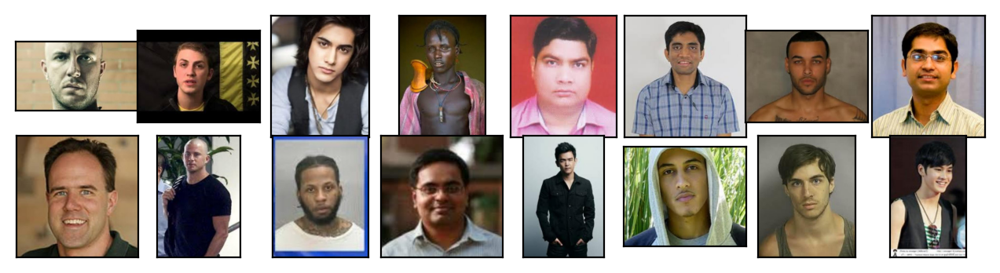

In [3]:
# Showing samples:
random.seed(42) # For reproducibility

imgs_men = os.listdir(pathMen) # Los of men images
imgs_women = os.listdir(pathWomen) # List of women images
imgs_baby = os.listdir(pathBaby) # List of baby images

# Creating random samples per category:
n_samples = 16

samples_men = random.sample(imgs_men, n_samples) # Randomly sample 16 images from men
samples_woman = random.sample(imgs_women, n_samples) # Ramdomly sample 16 imges from women
samples_baby = random.sample(imgs_baby, n_samples) # Randomply sample 16 images from baby

fig = plt.figure(dpi=200, figsize=(8, 2)) # Create a figure

# Showing the 16 images from men
for i in range(n_samples):
    ax = plt.subplot(2, 8, i+1) # Create a subplot
    img = Image.open(f"{pathMen}/{samples_men[i]}") # Open the image
    plt.imshow(img) # Show the image
    plt.xticks([]) # Remove x ticks
    plt.yticks([]) # Remove y ticks
    
plt.subplots_adjust(wspace=-0.01, hspace=-0.01) # Adjust the spacing
plt.show()

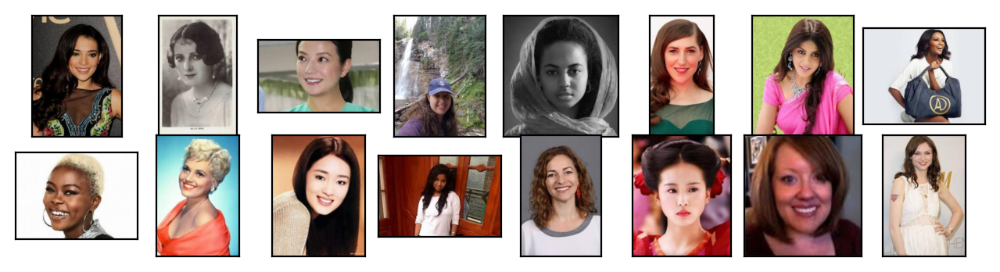

In [4]:
# Showing women samples:
fig = plt.figure(dpi=200, figsize=(8, 2)) # Create a figure

for i in range(n_samples):
    ax = plt.subplot(2, 8, i+1)
    img = Image.open(f"{pathWomen}/{samples_woman[i]}")
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])

plt.subplots_adjust(wspace=-0.01, hspace=-0.01)
plt.show()

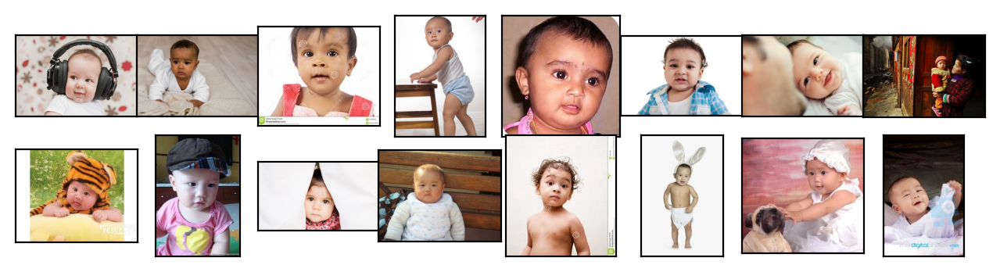

In [5]:
# Showing baby samples:
fig = plt.figure(dpi=200, figsize=(8, 2)) # Create a figure

for i in range(n_samples):
    ax = plt.subplot(2, 8, i+1)
    img = Image.open(f"{pathBaby}/{samples_baby[i]}")
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])

plt.subplots_adjust(wspace=-0.01, hspace=-0.01)
plt.show()

# Defining the VAE architecture:

In [6]:
# Detecting if a GPU is available:
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Device used: {torch.cuda.get_device_name(0)}") if device == "cuda" else print("No GPU available: Using CPU")

Device used: NVIDIA GeForce RTX 5080


In [7]:
# Transforming the data and creating batches for training:
transform = T.Compose([T.Resize((256, 256)), T.ToTensor()]) # Transforming the data into tensors of 256x256 with normalized pixels [0.0 - 1.0]
data = torchvision.datasets.ImageFolder(root=targetPath, transform=transform)
batch_size = 16
loader = torch.utils.data.DataLoader(data, batch_size=batch_size, shuffle=True)

In [8]:
# Defining the architecture for the VAE:
latent_dims = 100 # Size of latent space

class Encoder(NN.Module):
    def __init__(self, latent_dims=latent_dims):
        super().__init__()
        # ###########################################
        # ############# Architecture 1: #############
        # ###########################################

        # self.conv1 = NN.Conv2d(3, 8, 3, stride=2, padding=1) # Input: 3x256x256 -> Output: 8x128x128
        # self.conv2 = NN.Conv2d(8, 16, 3, stride=2, padding=1) # Input: 8x128,128 -> Output: 16x64x64
        # self.batch2 = NN.BatchNorm2d(16) # Batch normalization layer
        # self.conv3 = NN.Conv2d(16, 32, 3, stride=2, padding=0) # Input: 16x64x64 -> Output: 32x31x31
        # self.linear = NN.Linear(31*31*32, 1024) # Fully connected layer

        # ###########################################


        # ###########################################
        # ############# Architecture 2: #############
        # ###########################################

        self.conv1 = NN.Conv2d(3, 32, 3, stride=2, padding=1) # Input: 3x256x256 -> Output: 32x128x128
        self.conv2 = NN.Conv2d(32, 64, 3, stride=2, padding=1) # Input: 32x128,128 -> Output: 64x64x64
        self.batch2 = NN.BatchNorm2d(64) # Batch normalization layer
        self.conv3 = NN.Conv2d(64, 128, 3, stride=2, padding=0) # Input: 64x64x64 -> Output: 128x31x31
        self.linear = NN.Linear(31*31*128, 1024) # Fully connected layer

        # ###########################################


        self.linear_mu = NN.Linear(1024, latent_dims) # Fully connected layer for mean
        self.linear_log_var = NN.Linear(1024, latent_dims) # Fully connected layer for log variance

        self.N = torch.distributions.Normal(0, 1) # Stardard normal distribution
        self.N.loc = self.N.loc.cuda() # Move to GPU if available
        self.N.scale.cuda() # Move to GPU id available

    def forward(self, x):
        x = x.to(device) # Move input to GPU or CPU
        x = F.relu(self.conv1(x))
        x = F.relu(self.batch2(self.conv2(x)))
        x = F.relu(self.conv3(x))

        x = torch.flatten(x, start_dim=1)
        x = F.relu(self.linear(x))

        mu = self.linear_mu(x) # Compute mean
        log_var = self.linear_log_var(x) # Compute log variance

        return mu, log_var
    
class Decoder(NN.Module):
    def __init__(self, latent_dims=latent_dims):
        super().__init__()
        # ###########################################
        # ############# Architecture 1: #############
        # ###########################################

        # self.decoder_lin = NN.Sequential(
        #     NN.Linear(latent_dims, 1024),
        #     NN.ReLU(True),
        #     NN.Linear(1024, 31*31*32),
        #     NN.ReLU(True)
        # )

        # self.unflatten = NN.Unflatten(dim=1, unflattened_size=(32, 31, 31))
        # self.decoder_conv = NN.Sequential(
        #     NN.ConvTranspose2d(32, 16, 3, stride=2, padding=0, output_padding=1),
        #     NN.BatchNorm2d(16),
        #     NN.ReLU(True),
        #     NN.ConvTranspose2d(16, 8, 3, stride=2, padding=1, output_padding=1),
        #     NN.BatchNorm2d(8),
        #     NN.ReLU(True),
        #     NN.ConvTranspose2d(8, 3, 3, stride=2, padding=1, output_padding=1)
        # )

        ###########################################


        # ###########################################
        # ############# Architecture 2: #############
        # ###########################################

        self.decoder_lin = NN.Sequential(
            NN.Linear(latent_dims, 1024),
            NN.ReLU(True),
            NN.Linear(1024, 31*31*128),
            NN.ReLU(True)
        )

        self.unflatten = NN.Unflatten(dim=1, unflattened_size=(128, 31, 31))
        self.decoder_conv = NN.Sequential(
            NN.ConvTranspose2d(128, 64, 3, stride=2, padding=0, output_padding=1),
            NN.BatchNorm2d(64),
            NN.ReLU(True),
            NN.ConvTranspose2d(64, 32, 3, stride=2, padding=1, output_padding=1),
            NN.BatchNorm2d(32),
            NN.ReLU(True),
            NN.ConvTranspose2d(32, 3, 3, stride=2, padding=1, output_padding=1)
        )

        ###########################################


    def forward(self, x):
        x = self.decoder_lin(x)
        x = self.unflatten(x)
        x = self.decoder_conv(x)
        x = torch.sigmoid(x) # Ensure an output in [0 - 1]

        return x
    
class VAE(NN.Module):
    def __init__(self, latent_dims=latent_dims):
        super().__init__()
        self.encoder = Encoder(latent_dims)
        self.decoder = Decoder(latent_dims)

    def reparametrize(self, mu, log_var):
        std = torch.exp(0.5 * log_var) # Compute standard deviation from log variance
        eps = torch.rand_like(std) # Sample form standard normal distribution

        return mu + eps * std
    
    def forward(self, x):
        x = x.to(device)
        mu, log_var = self.encoder(x)
        z = self.reparametrize(mu, log_var)

        return self.decoder(z), mu, log_var

In [9]:
# Initialize VAE model and move it to the device
vae = VAE().to(device)
lr = 1e-4 # Learning rate
optimizer = torch.optim.Adam(vae.parameters(), lr=lr, weight_decay=1e-5) # Adam Optimizer

In [10]:
# Define train epoch function:
def train_epoch(epoch, beta):
    vae.train()
    epoch_loss = 0 # Accumulate the loss over the epoch

    for imgs, _ in loader:
        imgs = imgs.to(device)
        recon_imgs, mu, log_var = vae(imgs)

        #reconstruction_loss = F.mse_loss(recon_imgs, imgs, reduction='sum') # Mean Squared Error loss
        
        # Experiment: Change MSE for Binary Cross Entropy using 'mean' instead of 'sum':
        reconstruction_loss = F.binary_cross_entropy(recon_imgs, imgs, reduction='mean') # Binary Cross Entropy Error loss
        
        #kl_div = -0.5 * torch.sum(1 + log_var - mu.pow(2) - log_var.exp()) # KL Divergence
        
        # Experiment: Change 'sum' for 'mean':
        kl_div = -0.5 * torch.mean(1 + log_var - mu.pow(2) - log_var.exp()) # KL Divergence

        # Experiment: Modifying the strength of KL regularization using beta:
        loss = reconstruction_loss + beta * kl_div  # Total loss
        optimizer.zero_grad()
        loss.backward()

        # Experiment: Cutting the gradient values to avoid INF or NaN:
        NN.utils.clip_grad_norm_(vae.parameters(), max_norm=1.0)

        optimizer.step()
        epoch_loss += loss.item()

    print(f"At epoch {epoch}, loss is {epoch_loss}")

# Define plot function for reconstructions:
def plot_epoch():
    with torch.no_grad():
        noise = torch.randn(18, latent_dims).to(device) # Generate random noise in latent space
        imgs = vae.decoder(noise).cpu() # Decode the noise to generate images and move to CPU
        imgs = torchvision.utils.make_grid(imgs, 6, 3).numpy() # Arrange images in a grid

        fig, ax = plt.subplots(figsize=(6,3), dpi=100)
        plt.imshow(np.transpose(imgs, (1, 2, 0)))
        plt.axis("off")
        plt.show()

At epoch 0, loss is 551.1073834896088


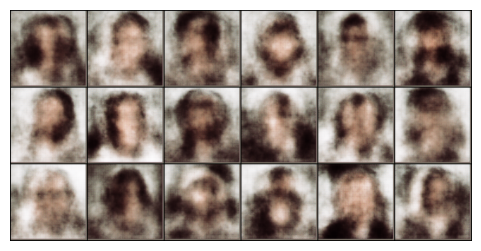

At epoch 1, loss is 507.0725026726723


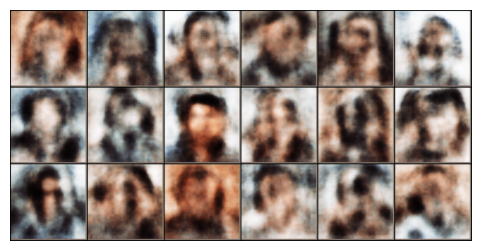

At epoch 2, loss is 499.8498848080635


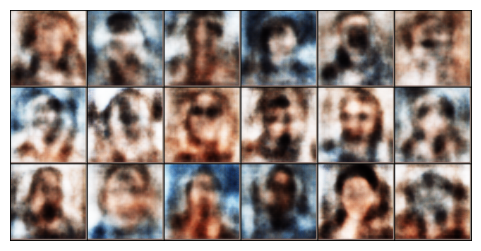

At epoch 3, loss is 497.59287482500076


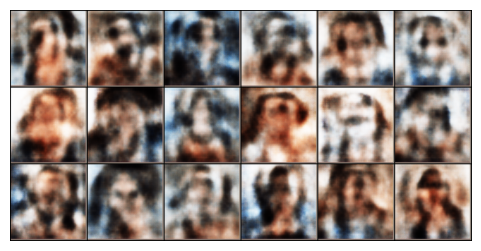

At epoch 4, loss is 496.81857600808144


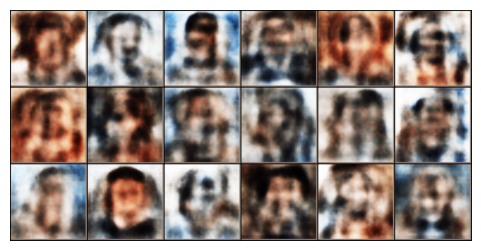

At epoch 5, loss is 496.36768156290054


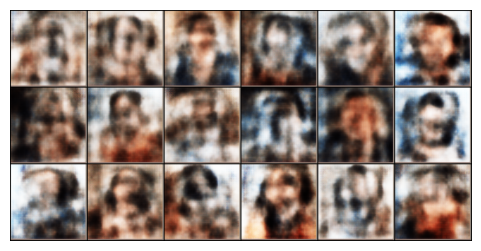

At epoch 6, loss is 496.3308836221695


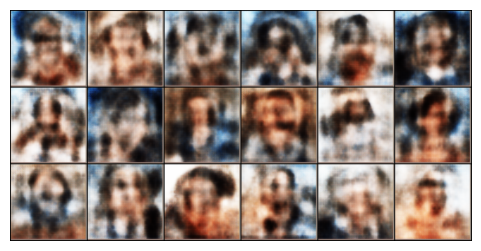

At epoch 7, loss is 496.32415452599525


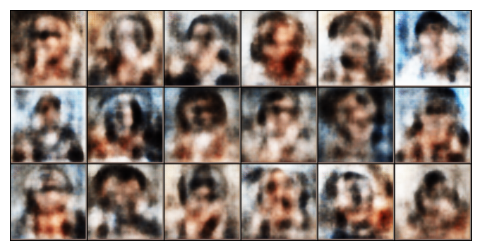

At epoch 8, loss is 496.45036908984184


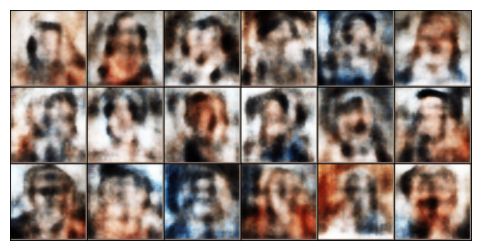

At epoch 9, loss is 496.2313152551651


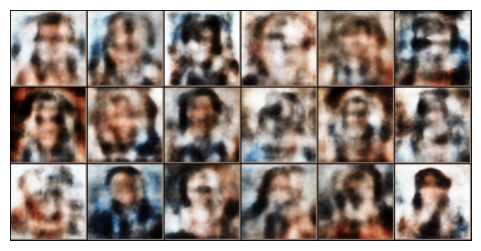

At epoch 10, loss is 496.34317404031754


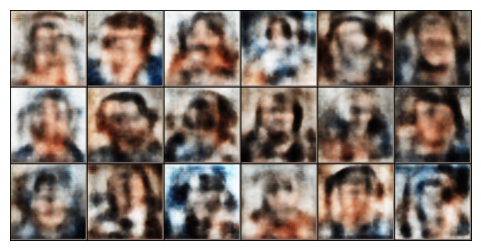

At epoch 11, loss is 496.44707667827606


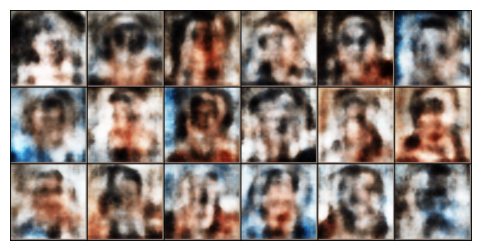

At epoch 12, loss is 496.9516930580139


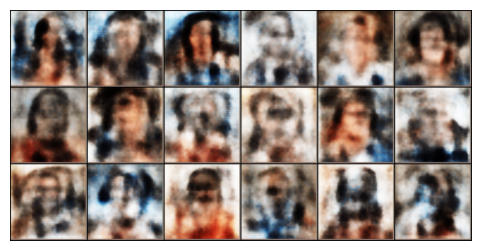

At epoch 13, loss is 497.0225313305855


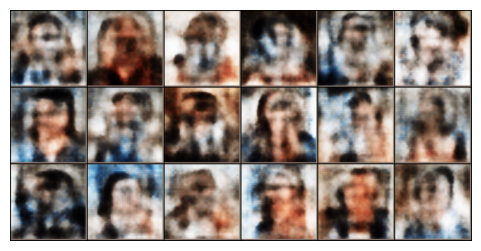

At epoch 14, loss is 497.3021984100342


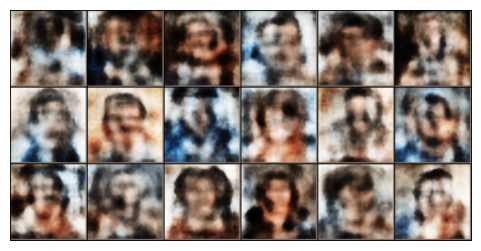

At epoch 15, loss is 497.5787142813206


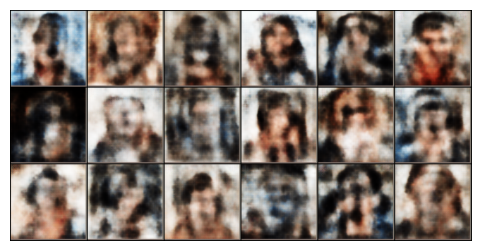

At epoch 16, loss is 497.920218706131


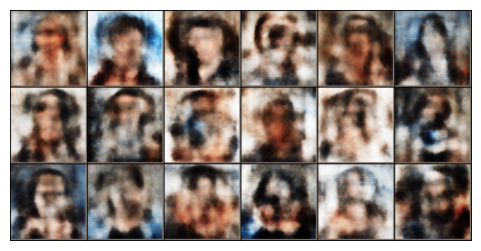

At epoch 17, loss is 498.15086817741394


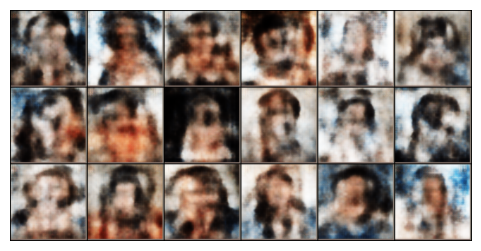

At epoch 18, loss is 498.6266216933727


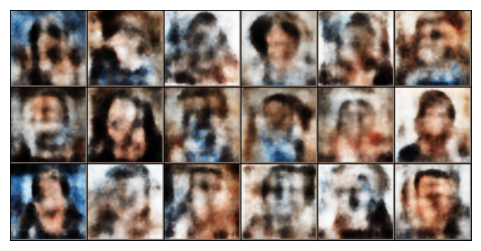

At epoch 19, loss is 498.8712005317211


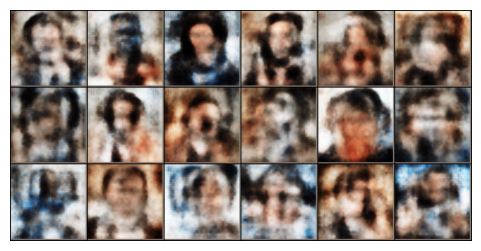

At epoch 20, loss is 499.2074625790119


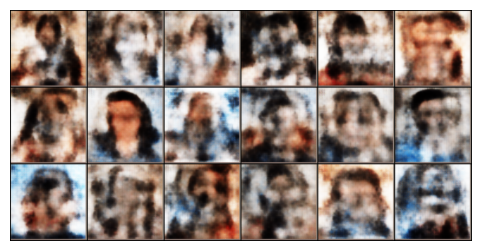

At epoch 21, loss is 499.4580505788326


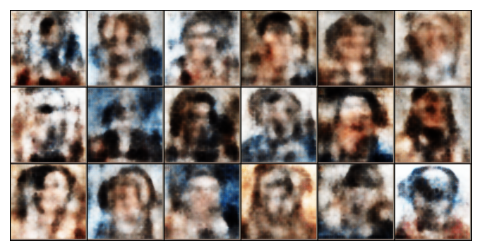

At epoch 22, loss is 499.843307107687


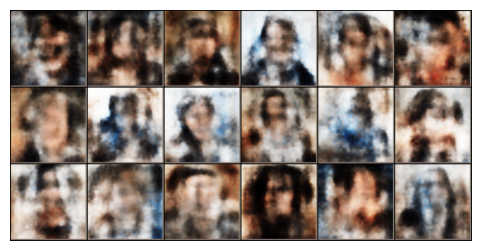

At epoch 23, loss is 500.0901037454605


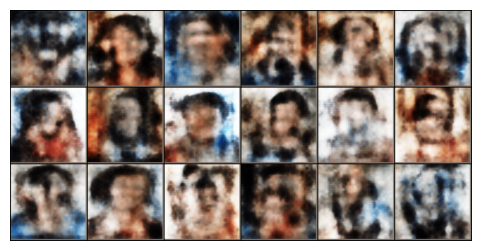

At epoch 24, loss is 500.3827278614044


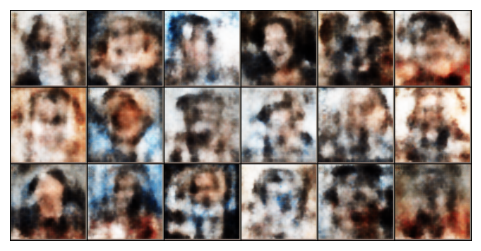

At epoch 25, loss is 500.83375599980354


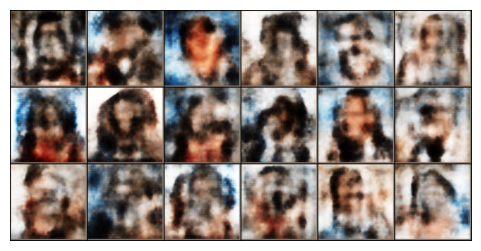

At epoch 26, loss is 501.0005227923393


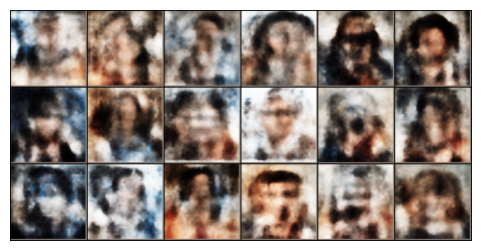

At epoch 27, loss is 501.3987766504288


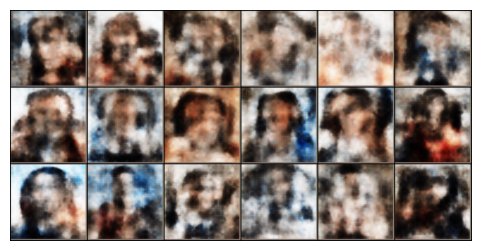

At epoch 28, loss is 501.6648714840412


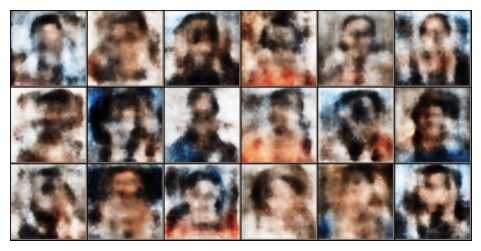

At epoch 29, loss is 501.84305423498154


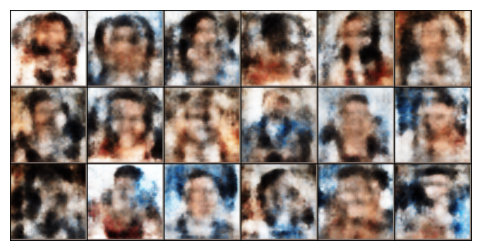

At epoch 30, loss is 502.32599651813507


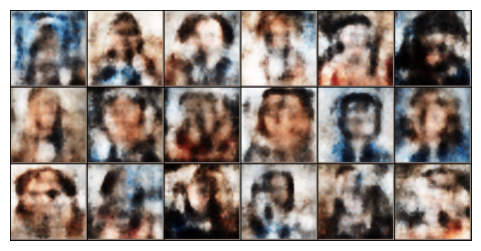

At epoch 31, loss is 502.18724128603935


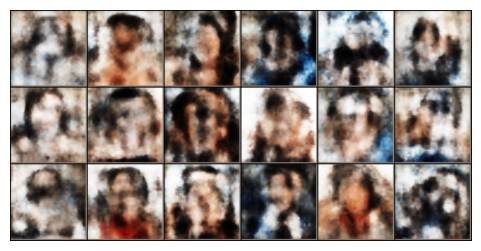

At epoch 32, loss is 502.0461195409298


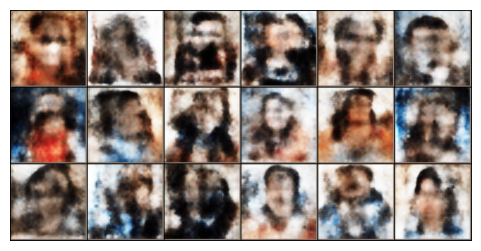

At epoch 33, loss is 501.87861770391464


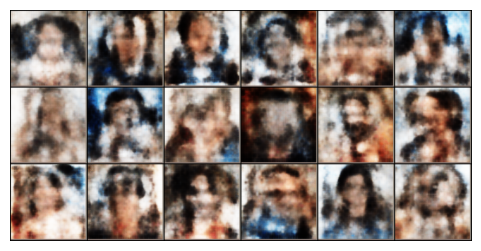

At epoch 34, loss is 501.77164378762245


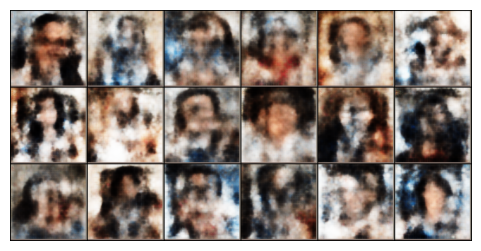

At epoch 35, loss is 501.56108126044273


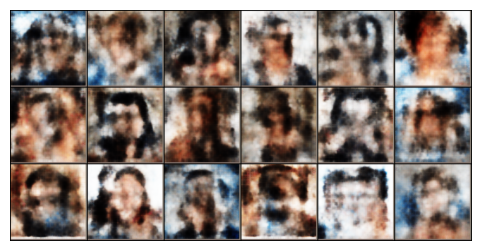

At epoch 36, loss is 501.61928567290306


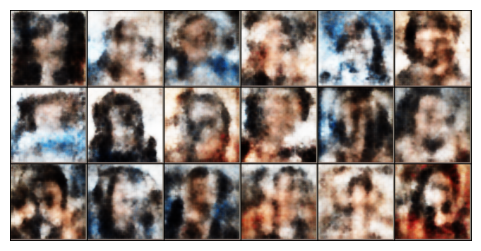

At epoch 37, loss is 501.4167934656143


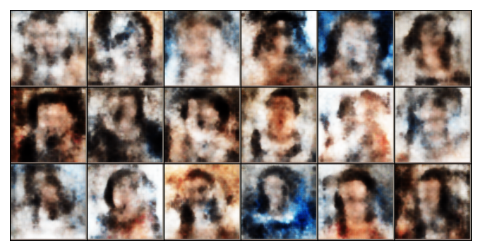

At epoch 38, loss is 501.31163078546524


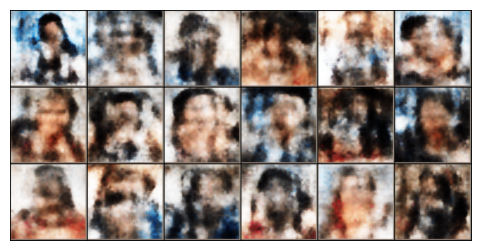

At epoch 39, loss is 501.22799676656723


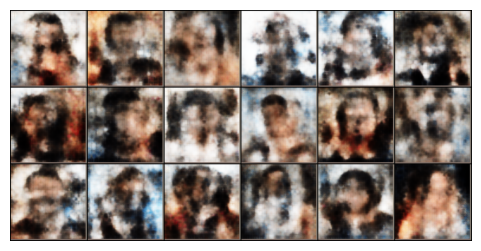

At epoch 40, loss is 501.01694440841675


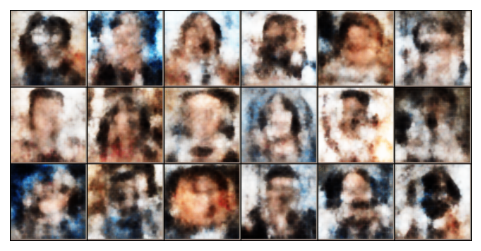

At epoch 41, loss is 500.9608581364155


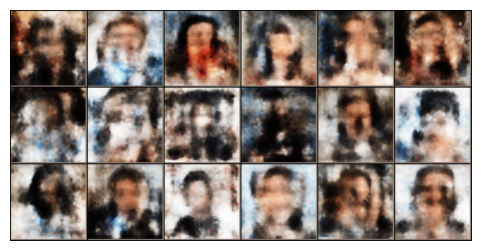

At epoch 42, loss is 500.89450293779373


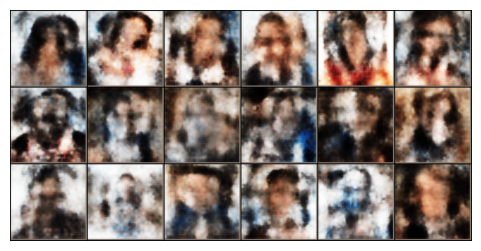

At epoch 43, loss is 500.785013705492


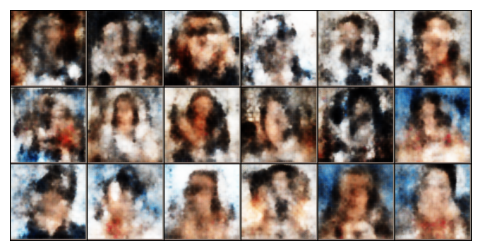

At epoch 44, loss is 500.63502565026283


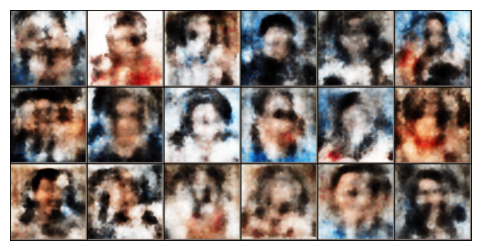

At epoch 45, loss is 500.6227785050869


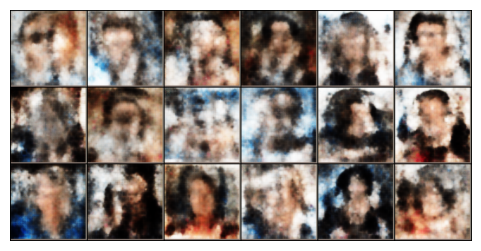

At epoch 46, loss is 500.4635543525219


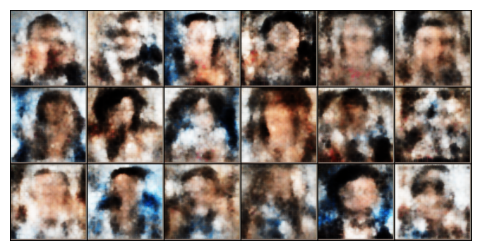

At epoch 47, loss is 500.445729970932


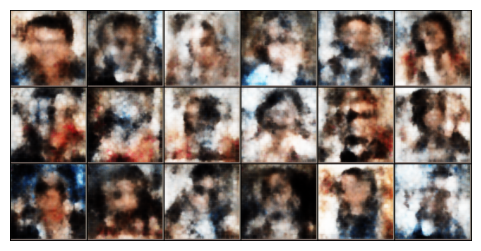

At epoch 48, loss is 500.2834235429764


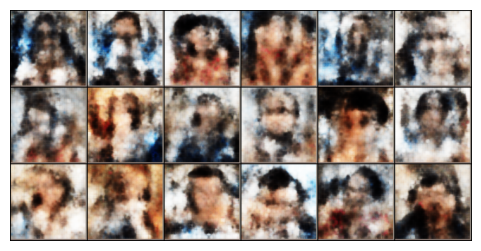

At epoch 49, loss is 500.20209297537804


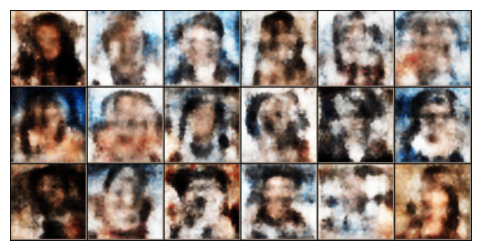

In [11]:
# ==========================================================================
# ####### MODEL TRAINING (EXCECUTE ONLY IF RE-TRAINING IS NECESSARY) #######
# ==========================================================================

n_epochs = 50
max_beta = 0.1
warmup_epochs = 30

for epoch in range(n_epochs):

    beta = max_beta * min(1.0, (epoch / warmup_epochs)) # Strength of KL regularization

    train_epoch(epoch, beta) # Train for one epoch
    plot_epoch()

# Saving the trained model:
torch.save(vae.state_dict(), "../models/vae_UTKFace.pth")

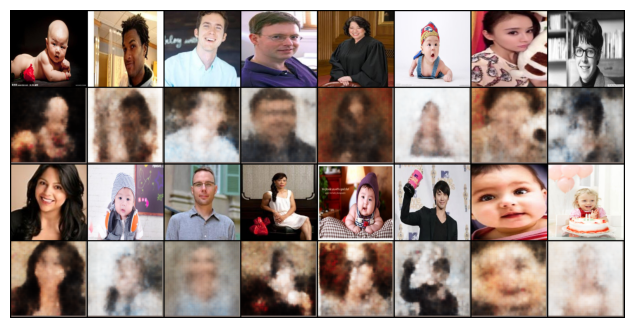

In [12]:
# Generating images using the trained model:
vae.eval()

with torch.no_grad():
    vae.load_state_dict(torch.load("../models/vae_UTKFace.pth", map_location=device))
    imgs, _ = next(iter(loader)) # Get a batch of images
    imgs = imgs.to(device)
    recon_imgs, mu, log_var = vae(imgs) # Forward pass through VAE

    # Concatenate the original and reconstructed images:
    images = torch.cat([
        imgs[:8].detach().cpu(),
        recon_imgs[:8].detach().cpu(),
        imgs[8:16].detach().cpu(),
        recon_imgs[8:16].detach().cpu()
    ], dim=0)

    images = torchvision.utils.make_grid(images, 8, 4)
    fig, ax = plt.subplots(figsize=(8, 4), dpi=100)
    plt.imshow(np.transpose(images.numpy(), (1, 2, 0)))
    plt.axis("off")
    plt.show()

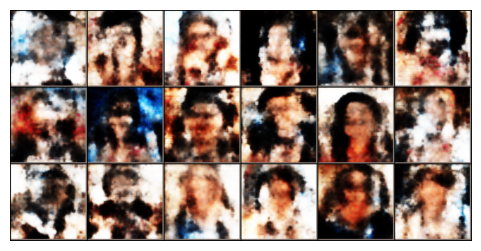

In [13]:
plot_epoch()

# Encoding Arithmetic with VAE

In [14]:
torch.manual_seed(0)
samples = 25

data.

men = []
for i in range(samples):

SyntaxError: invalid syntax (62368051.py, line 4)